In [ ]:
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

# End to end multiclass dog breed Classification
This notebook builds an end to end multiclass image classifier using Tensorflow2.0 and Tensorflow Hub.

## 1. Problem
Identifying the breed of a  dog given an image of a dog.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition.

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features
Some imformation about the data:

* We're dealing with images (unstructured data), so its probability best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this mean there are 120 different classes)
* There are around 10000+ images in the training set (these images have labels)
* There are around 10000+ images in the test set (these images have no labels, because we'll want to predict them.)

# Getting Workplace ready

* Import Tensorflow 2.x
* Import Tensorflow HUb
* Make sure we're using GPU

In [ ]:
# Import Tensorflow into colab
import tensorflow as tf
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("TF Hub Version:", hub.__version__)

# check for gpu availability
print("GPU","available!!!" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.17.0
TF Hub Version: 0.16.1
GPU available!!!


## Getting our data ready (turning into tensors)
With all Ml models, our data has to be in numerical format. So that's what we'll be doing first. Turning images into Tensors (numerical representation)

In [ ]:
# checkout the labels of our data
import pandas as pd
labels = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
labels = labels.head(9720)



<Axes: xlabel='breed'>

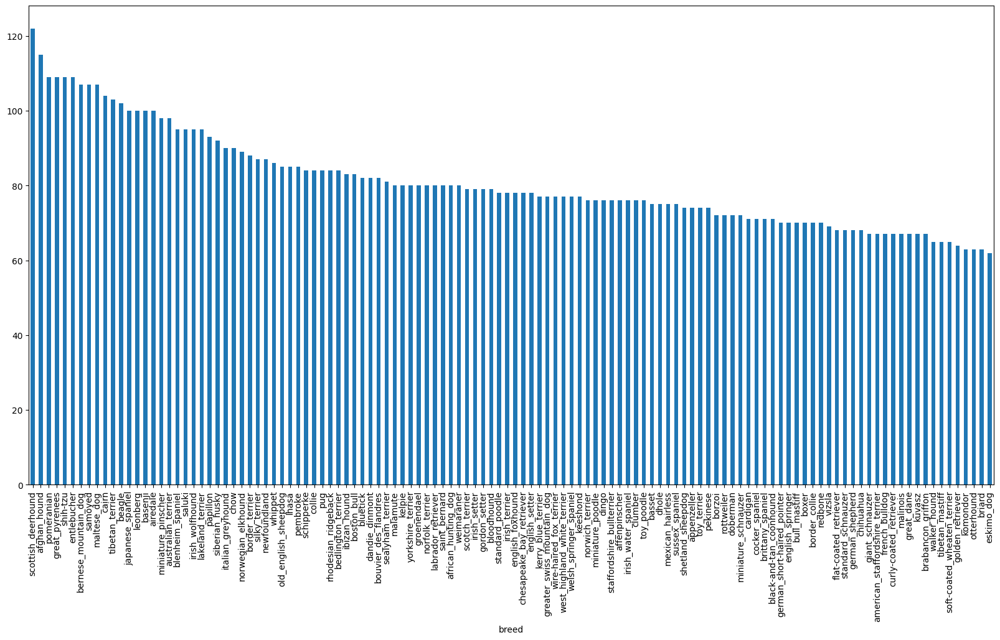

In [ ]:
# How many images are there of each breed
labels["breed"].value_counts().plot(kind='bar', figsize=(20,10))

In [ ]:
labels["breed"].value_counts().median()

78.0

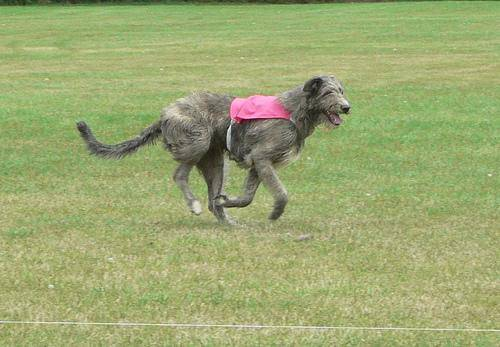

In [ ]:
#Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/f4a20b0c57e1fc7214548b4556a467f5.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames.

In [ ]:
# create pathname from image ID's

filenames = ["drive/MyDrive/Dog Vision/train/"+fname+".jpg" for fname in labels["id"]]
filenames

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog Vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog Vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [ ]:
# check whether number of filenames matchesa number of actual images
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(labels):
  print("Filenames match actual amount of files!!!")
else:
  print("Filename do not match")

Filenames match actual amount of files!!!


In [ ]:
len(os.listdir("drive/MyDrive/Dog Vision/train"))

9720

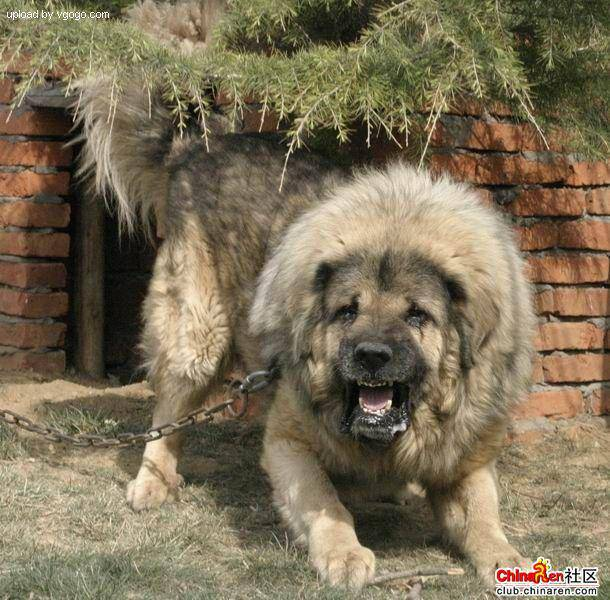

In [ ]:
#One more check
Image(filenames[9000])

Since we've now got our training image filepaths in a list, lets prepare our labels

In [ ]:
import numpy as np
breed_labels_arr = labels["breed"]
breed_labels_arr = np.array(breed_labels_arr)
breed_labels_arr

array(['boston_bull', 'dingo', 'pekinese', ..., 'samoyed', 'collie',
       'irish_wolfhound'], dtype=object)

In [ ]:
len(breed_labels_arr)

9720

In [ ]:
# see if number of labels_breed matches filenames
if len(breed_labels_arr) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels do not match number of filenames")

Number of labels matches number of filenames


In [ ]:
# find unique labels_breed values
unique_breeds = np.unique(breed_labels_arr)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single element from breed_labels_arr into an array of bool
print(breed_labels_arr[0])
breed_labels_arr[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a bool array
bool_labels = [labels == unique_breeds for labels in breed_labels_arr]
bool_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(bool_labels)

9720

In [ ]:
# example: turning boolean arrays into integers
print(breed_labels_arr[0]) # original labels
print(np.where(unique_breeds == breed_labels_arr[0])) # index where label occurs
print(bool_labels[0].argmax()) # index where label occurs in unique_breeds
print(bool_labels[0].astype(int)) # there will be a 1 where the unique_breeds matches

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

In [ ]:
# Setup X and y
X = filenames
y = bool_labels

In [ ]:
len(filenames)

9720

We're going to startoff experimenting with ~1000 images and increase as needed

In [ ]:
# set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}


In [ ]:
# lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

# split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

## Preprocessing Images (turning images into tensors)

To preprocess our images into tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable. `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modifed `image`


Before we do, let's see what importing an image looks like.

In [ ]:
# Convert an image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# turn image into a tensor
tf.constant(image) # tensor


<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we've seen what an image looks like as a tensor, let's make a function to preprocess them.

In [ ]:
# define the image size
IMG_SIZE = 224

# create a function
def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # read in an image file
  image = tf.io.read_file(image_path)
  # turn the jpg image into numerical tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image,channels=3)
  # convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)
  # resize the image to our desired size (224,224)
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you are trying to process 10000+ images in one go... they all might not fit into memory.

So thats why we do about 32 (this is batch size) images at a time (you can manually adjust the batch size if need be).

In order to use Tensorflow effectively, we need our data in the form of Tensor tuples which look like this: `(image, label)`

In [ ]:
# create a simple function to return a tuple (image, label)

def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# demo of the above function
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, labels)`,lets make a function to turn all of our data (`X`&`y`) into batches.

In [ ]:
# define the batch size, 32 is good start
BATCH_SIZE = 32

# create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if its training data but dosent shuffle if its validation data.
  Also accepts test data as input (no labels).
  """
  # if the data is a test dataset, we probably dont have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the dat is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y))) # filepaths
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # if the data is a training dataset, we need to shuffle it
    print('Creating training data batches...')
    # turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling
    data = data.shuffle(buffer_size=len(X))
    # map the process_image function to each sample
    data = data.map(get_image_label)
    # create batches of data
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [ ]:
# create training and validation data batches
train_data  = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

Our data is now in batches, however these can be a little hard to understand/comprehend, lets visualize them.

In [ ]:
import matplotlib.pyplot as plt

#create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays 25 images from a data batch.
  """
  # setup the figure
  plt.figure(figsize=(10,10))
  # loop through 25 (for displaying 25 images)
  for i in range(25):
    #Create subplots
    ax = plt.subplot(5,5,i+1)
    # display an image
    plt.imshow(images[i])
    # add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # turn the grid lines off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[2.14154497e-01, 1.78860381e-01, 1.32441251e-02],
          [2.79588044e-01, 2.47751787e-01, 6.55559227e-02],
          [3.72185439e-01, 3.45049590e-01, 1.27157420e-01],
          ...,
          [2.45265409e-01, 2.21735999e-01, 2.56575420e-02],
          [2.32816979e-01, 2.17130706e-01, 2.63089110e-04],
          [3.20571035e-01, 3.04884762e-01, 5.39043695e-02]],
 
         [[2.18985885e-01, 1.88891351e-01, 1.54757202e-02],
          [2.43780494e-01, 2.17607528e-01, 2.66848989e-02],
          [3.33213687e-01, 3.11277419e-01, 8.60037059e-02],
          ...,
          [2.91625172e-01, 2.68095762e-01, 7.20173270e-02],
          [2.61982411e-01, 2.46296138e-01, 1.01738172e-02],
          [3.35083812e-01, 3.19397539e-01, 7.10169300e-02]],
 
         [[2.39293307e-01, 2.15763897e-01, 2.58829333e-02],
          [2.77637154e-01, 2.54456729e-01, 5.05538173e-02],
          [2.75643885e-01, 2.56351143e-01, 2.73245294e-02],
          ...,
          [2.92027503e-01, 2.68498093e-01, 7.2485

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

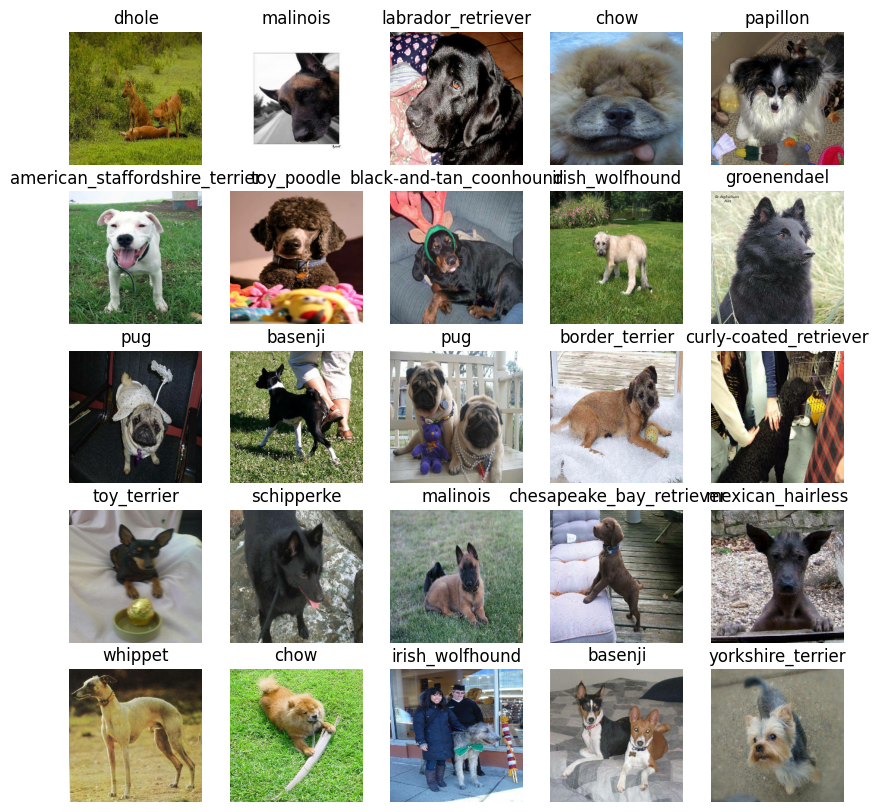

In [ ]:
# now lets visualized the data in a training batch
show_25_images(train_images, train_labels)

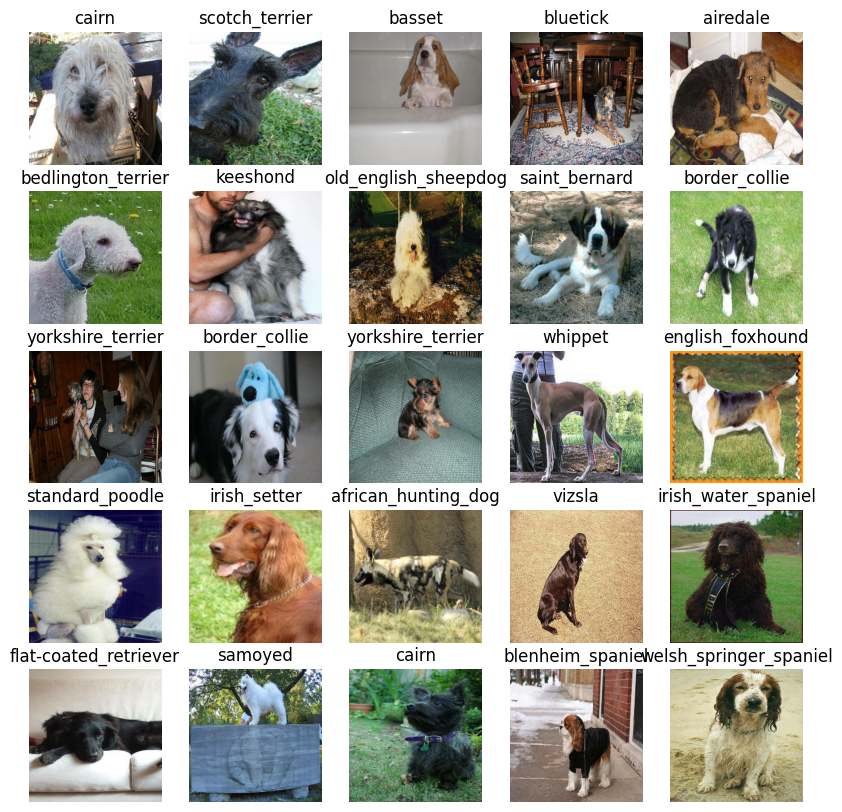

In [ ]:
# now lets visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building the model

Before we build a model, there are a few things we need to define:

* The input shape (our images shape, in the form of tensors) to our model
* The output shape (image labels, in the form of tensors) of our model
* The URL of the model we want to use.

In [ ]:
# setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels
INPUT_SHAPE

# setup output shape to the model
OUTPUT_SHAPE = len(unique_breeds)
OUTPUT_SHAPE

# setup model URL from tensorflow Hub
MODEL_URL = 'https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1'

Now we've got our inputs, outputs and model URL, lets build our model

Lets create a function which:
* Takes the input shape, output shape and model we've chosen as parameters.
* defines the layers in a Keras model in sequential fashion (do this first, then this, then that)
* Compiles the model (says it should be evaluated and improved)
* Building the model (tells the model input shape it'll be getting)
* Returns the model



In [ ]:
from tensorflow import keras
print(tf.__version__)


import keras
print(keras.__version__)


import tf_keras
print(tf_keras.__version__)


2.17.0
3.4.1
2.17.0


In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

 # Setup the model layers
  model = tf_keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf_keras.layers.Dense(units=OUTPUT_SHAPE, # Use tf.keras.layers.Dense here
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(),
      optimizer=tf_keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)


  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
print('hi')

hi


## Creating callbacks

Callbacks are helper functions a mdoel can use during training to do such things and save its progess, check its progress or stop training early if a modelstops improving

We'll create 2 callbacks, one for TensorBoard which helps track our model progress and another for early stopping which prevents our model form training for too long.

### TensorBoard Callback
To setup a tensorboard callback, we need to do 3 things:
1. Load the tensorboard notebook extension
2. create a tensorboard callback which is able to save logs to a directory and pass it to our models `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training)

In [ ]:
# load tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(logdir)

### Early stopping callback
Early stopping helps our model from overfitting by stopping training if a certain evaluation metric stop improving


In [ ]:
early_stopping  = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

### Training a model (on a subset of data)

Our first model is only going to train on 1000 images.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}


In [ ]:
# function for train model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # create model
  model = create_model()

  # create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])

  return model

In [ ]:
model = train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 [==============================] - 113s 3s/step - loss: 4.6935 - accuracy: 0.1050 - val_loss: 3.7098 - val_accuracy: 0.1950
Epoch 2/100
25/25 [==============================] - 4s 160ms/step - loss: 1.7081 - accuracy: 0.6725 - val_loss: 2.3272 - val_accuracy: 0.4750
Epoch 3/100
25/25 [==============================] - 3s 139ms/step - loss: 0.5840 - accuracy: 0.9275 - val_loss: 1.7583 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 4s 166ms/step - loss: 0.2630 - accuracy: 0.9862 - val_loss: 1.5840 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 4s 168ms/step - loss: 0.1503 - accuracy: 0.9975 - val_loss: 1.5038 - val_accuracy: 0.6150
Epoch 6/100
25/25 [==============================] - 4s 168ms/step - loss: 0.1018 - accuracy: 1.0000 - val_loss: 1.4542 - val_accuracy: 0.6100
Epoch 7/100
25/25 [====================

It looks like our model is overfitting because it's performing far better on training dataset tan the validation dataset

### Checking the tensorboard log

The tensorboard magic function will access the logs directory we created earlier and visualize it.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

# Making and evaluating predictoins using trained model

In [ ]:
# make predictions on the validation set
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 96ms/step


array([[2.6735612e-03, 3.8121210e-04, 4.0333779e-03, ..., 1.4978151e-04,
        4.6627887e-05, 6.1436831e-03],
       [8.8730961e-04, 2.1058634e-04, 4.4457223e-03, ..., 6.0358777e-04,
        1.9542289e-03, 2.2330043e-04],
       [2.3178536e-06, 5.6108547e-04, 5.2837586e-05, ..., 1.4856045e-05,
        4.2576536e-05, 8.7148196e-04],
       ...,
       [9.2038345e-06, 1.1419221e-04, 2.5161981e-04, ..., 3.3090403e-04,
        1.3678716e-03, 1.7072861e-04],
       [1.1981833e-03, 2.3496023e-04, 9.7255994e-05, ..., 3.9585571e-05,
        5.5492907e-05, 1.7743036e-02],
       [3.8920462e-04, 8.0916514e-05, 6.2857679e-04, ..., 1.0815762e-03,
        2.3015493e-03, 4.3370651e-06]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[0]

array([2.67356122e-03, 3.81212099e-04, 4.03337786e-03, 5.43381357e-05,
       2.86023896e-05, 1.55184433e-04, 3.54774408e-02, 7.32729386e-04,
       2.50921294e-04, 7.78827933e-04, 4.71028266e-04, 1.87097132e-04,
       4.28563030e-03, 2.77351846e-05, 9.46580491e-04, 3.79361038e-04,
       4.68588005e-05, 1.68698609e-01, 4.80770541e-05, 1.54601687e-04,
       9.36677447e-04, 2.05174147e-04, 4.59640396e-05, 2.85843690e-03,
       4.09836939e-05, 5.14994026e-04, 1.73673645e-01, 1.08901462e-04,
       7.10946333e-04, 1.82175878e-04, 2.91675649e-04, 1.02743348e-02,
       1.21590996e-03, 2.74260783e-05, 6.87209977e-05, 3.73021290e-02,
       1.83323627e-05, 1.63005243e-04, 8.11698192e-06, 6.38739366e-05,
       1.33204705e-03, 1.08125263e-04, 1.42009696e-04, 8.90097697e-04,
       6.25874382e-05, 1.21077646e-04, 1.56194292e-05, 1.55543879e-04,
       1.10580714e-03, 5.64216789e-05, 2.36311680e-05, 1.01282887e-04,
       8.00017500e-04, 1.27433932e-05, 1.05368767e-04, 3.37878409e-05,
      

In [ ]:
# first prediction
index= 34
print(predictions[index])
print(f"Max Value (probability of prediction):{np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")


[3.03233974e-04 1.57383620e-04 1.48279025e-04 6.52935660e-06
 2.21884166e-05 3.64707608e-04 7.06668186e-04 4.65013509e-05
 1.47828141e-05 2.49942939e-04 2.43377362e-05 1.30875269e-04
 8.54804748e-05 6.88363070e-05 9.01313440e-04 8.26056275e-05
 2.86406343e-04 6.20689825e-05 4.17383388e-04 3.86761792e-04
 7.97484827e-05 1.91039187e-04 1.86186862e-05 9.61919068e-05
 9.70133533e-06 1.79986964e-04 2.57022068e-04 6.93555980e-04
 2.33060764e-05 1.64486104e-04 1.07534090e-03 3.56774945e-05
 9.42332917e-05 9.42692917e-04 2.36766391e-05 3.67290369e-04
 5.63388603e-05 1.72503132e-04 6.69832152e-05 5.43024507e-04
 1.75542315e-04 9.25252025e-05 1.60913332e-04 5.53838769e-03
 6.40387152e-05 1.32677247e-04 1.08407415e-03 3.69964764e-05
 8.15378080e-05 4.41471784e-04 6.68221764e-05 7.22081168e-05
 4.99729242e-04 3.13449491e-05 1.94204983e-03 2.75636616e-04
 6.84404877e-05 7.27644965e-06 4.90888051e-05 1.71996202e-04
 5.57952881e-05 5.87636569e-05 2.14182725e-03 3.18099665e-05
 9.05366251e-05 1.618112

Having the above functionalities is great but we want to  be able to do it at scale.

And it would be even better if we could see the image prediction is being made on!

**Note: ** Prediction probabilities are also known as confidence level

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation dataset is still in a batch, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels)

In [ ]:
# unbatching

images_ = []
labels_ = []

# loop through unbatch data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)


images_[0]
labels_[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# create a function to unbatch a dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns seperate arrays
  of images and labels.
  """
  images = []
  labels = []

  # loop through unbatched data
  for img, lab in data.unbatch().as_numpy_iterator():
    images.append(img)
    labels.append(unique_breeds[np.argmax(lab)])

  return images, labels




In [ ]:
# unbatchify the validation data

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'cairn'

Now we've got ways to get:
* Predictions labels
* Validation labels (truth labels)
* Validation images

Let's make a function to make these all a bit more visual.

We'll create a function which:
* Takesan array of probabilities, an array of thruth labels and an array of images, integers.
* Convert the prediction probabilities to a predicted label
* Plot the predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground thruth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # get pred label
  pred_label = get_pred_label(pred_prob)

  # plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"


  # CHange plot title to be predicted, probability of predicition and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100,true_label),color=color)


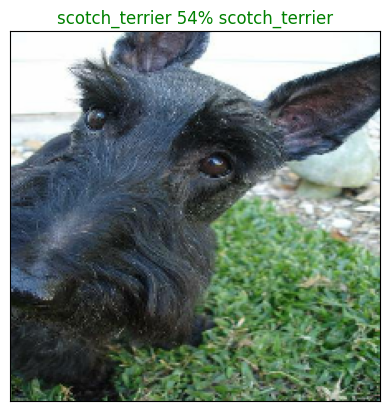

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=1)

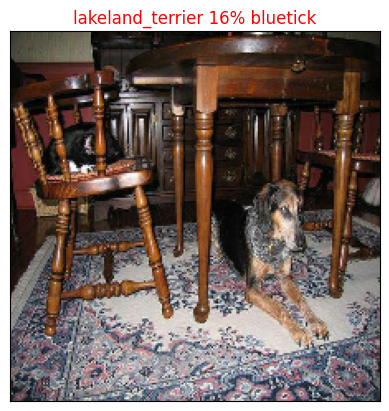

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=3)

Now we got one fuction to visualize our models op prediction, lets make another to view our models top 10 predictions

This function will:
* Takes an input of prediction probabilities array and a ground truth array and an integer
* Find the predicted labels using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probabilities values and labels, coloring the true label green.


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # get the predicted label
  pred_label = get_pred_label(pred_prob)

  # find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_indexes)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_indexes)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

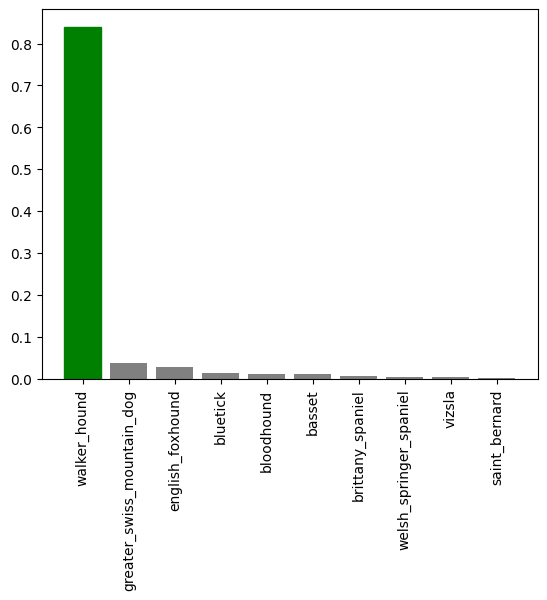

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=31)